# Interplation from LQ to HQ

## Import data sample

In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt

from neural_lam.downscaling_dataset import DownscalingDataset

# if you change the seed, make sure that the randomly-applied transforms
# properly show that the image can be both transformed and *not* transformed!
torch.manual_seed(0)

dataset = DownscalingDataset(
            "meps_example",
            pred_length=1,
            split="train",
            subsample_step=3,
            standardize=True,
        )

print(len(dataset))

sample_idx = torch.randint(len(dataset), size=(1,)).item()
batch = dataset[sample_idx]
LQ, HQ = batch['LQ'], batch['HQ']

print(LQ.shape, HQ.shape)

4
torch.Size([17, 268, 238]) torch.Size([17, 268, 238])


/Users/erila85/Library/CloudStorage/OneDrive-Linköpingsuniversitet/Desktop/git/Berzelius_code/neural-lam/neural_lam/utils.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.

/var/folders/16/8yvsfpws3tz2q2ll2_qyslpm0000gr/T/ipykernel_71439/1779196741.py:11: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  source_numpy = np.array(source[var])
/var/folders/16/8yvsfpws3tz2q2ll2_qyslpm0000gr/T/ipykernel_71439/1779196741.py:12: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  target_numpy = np.array(target[var])


Number of images: 10/100


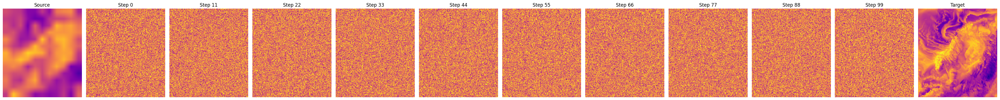

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import torch

from neural_lam import config

data_config = config.Config.from_file("./data_config.yaml")

def plot_states(source, target, states, interval=1, var=0, save=None):
    states = states[:, var, ...]
    source_numpy = np.array(source[var])
    target_numpy = np.array(target[var])

    total_states = len(states)
    num_images = total_states // interval

    # Select `num_images` evenly spaced indices
    selected_indices = np.linspace(0, total_states - 1, num_images, dtype=int)
    selected_images = states[selected_indices]

    print(f"Number of images: {len(selected_images)}/{len(states)}")

    vmin = min(source_numpy.min(), target_numpy.min())
    vmax = max(source_numpy.max(), target_numpy.max())

    # +2: source and target
    fig, axes = plt.subplots(1, num_images + 2, figsize=(3 * (num_images + 2), 5), subplot_kw={"projection": data_config.coords_projection},)

    axes[0].imshow(source_numpy, vmin=vmin, vmax=vmax, cmap="plasma", origin="lower")
    axes[0].set_title("Source")
    axes[0].axis("off") 

    for ax, img, idx in zip(axes[1:-1], selected_images, selected_indices):
        ax.imshow(img, vmin=vmin, vmax=vmax, cmap="plasma", origin="lower")
        ax.set_title(f"Step {idx}")
        ax.axis("off")  

    axes[-1].imshow(target_numpy, vmin=vmin, vmax=vmax, cmap="plasma", origin="lower")
    axes[-1].set_title("Target")
    axes[-1].axis("off")  

    plt.tight_layout()
    if save is not None:
        plt.savefig(f"{save}/process", bbox_inches='tight')

    plt.show()


# Testing
states = np.random.randn(100, 17, 268, 238)

plot_states(LQ, HQ, states, interval=10, var=4)

## IR-SDE

In [3]:
from argparse import ArgumentParser

def list_of_ints(arg):
    return list(map(int, arg.split(',')))

def get_default_args():
    parser = ArgumentParser(
        description="Train or evaluate NeurWP models for LAM"
    )
    parser.add_argument(
        "--data_config",
        type=str,
        default="neural_lam/data_config.yaml",
        help="Path to data config file (default: neural_lam/data_config.yaml)",
    )
    parser.add_argument(
        "--model",
        type=str,
        default="graph_lam",
        help="Model architecture to train/evaluate (default: graph_lam)",
    )
    parser.add_argument(
        "--subset_ds",
        action="store_true",
        help="Use only a small subset of the dataset, for debugging"
        "(default: false)",
    )
    parser.add_argument(
        "--seed", type=int, default=42, help="random seed (default: 42)"
    )
    parser.add_argument(
        "--n_workers",
        type=int,
        default=4,
        help="Number of workers in data loader (default: 4)",
    )
    parser.add_argument(
        "--epochs",
        type=int,
        default=200,
        help="upper epoch limit (default: 200)",
    )
    parser.add_argument(
        "--batch_size", type=int, default=4, help="batch size (default: 4)"
    )
    parser.add_argument(
        "--load",
        type=str,
        help="Path to load model parameters from (default: None)",
    )
    parser.add_argument(
        "--restore_opt",
        action="store_true",
        help="If optimizer state should be restored with model "
        "(default: false)",
    )
    parser.add_argument(
        "--precision",
        type=str,
        default=32,
        help="Numerical precision to use for model (32/16/bf16) (default: 32)",
    )

    # Model architecture
    parser.add_argument(
        "--graph",
        type=str,
        default="multiscale",
        help="Graph to load and use in graph-based model "
        "(default: multiscale)",
    )
    parser.add_argument(
        "--diffusion_model",
        type=str,
        default="graphcast",
        help="Model to use in the diffusion model"
        "(default: graphcast)",
    )
    parser.add_argument(
        "--hidden_dim",
        type=int,
        default=128,
        help="Dimensionality of all hidden representations (default: 64)",
    )
    parser.add_argument(
        "--latent_dim",
        type=int,
        default=None,
        help="Dimensionality of latent R.V. at each node (if different than"
        " hidden_dim) (default: None (same as hidden_dim))",
    )
    parser.add_argument(
        "--hidden_layers",
        type=int,
        default=1,
        help="Number of hidden layers in all MLPs (default: 1)",
    )
    parser.add_argument(
        "--processor_layers",
        type=int,
        default=6,
        help="Number of GNN layers in processor GNN (for prob. model: in "
        "decoder) (default: 6)",
    )
    parser.add_argument(
        "--encoder_processor_layers",
        type=int,
        default=1,
        help="Number of on-mesh GNN layers in encoder GNN (default: 2)",
    )
    parser.add_argument(
        "--prior_processor_layers",
        type=int,
        default=1,
        help="Number of on-mesh GNN layers in prior GNN (default: 2)",
    )
    parser.add_argument(
        "--mesh_aggr",
        type=str,
        default="sum",
        help="Aggregation to use for m2m processor GNN layers (sum/mean) "
        "(default: sum)",
    )
    parser.add_argument(
        "--output_std",
        action="store_true",
        help="If models should additionally output std.-dev. per "
        "output dimensions "
        "(default: False (no))",
    )
    parser.add_argument(
        "--shared_grid_embedder",
        action="store_true",  # Default to separate embedders
        help="If the same embedder MLP should be used for interior and boundary"
        " grid nodes. Note that this requires the same dimensionality for "
        "both kinds of grid inputs. (default: False (no))",
    )
    parser.add_argument(
        "--prior_dist",
        type=str,
        default="isotropic",
        help="Structure of Gaussian distribution in prior network output "
        "(isotropic/diagonal) (default: isotropic)",
    )
    parser.add_argument(
        "--learn_prior",
        type=int,
        default=1,
        help="If the prior should be learned as a mapping from previous state "
        "and forcing, otherwise static with mean 0 (default: 1 (yes))",
    )
    parser.add_argument(
        "--vertical_propnets",
        type=int,
        default=0, # TODO: Change to 1 as it is used in the paper
        help="If PropagationNets should be used for all vertical message "
        "passing (g2m, m2g, up in hierarchy), in deterministic models."
        "(default: 0 (no))",
    )
    parser.add_argument(
        "--sampler",
        type=str,
        default="heun",
        help="The sampler to use when generating trajectories with a diffusion model"
        "(heun/edm) (default: heun)",
    )

    # Training options
    parser.add_argument(
        "--ar_steps",
        type=int,
        default=1,
        help="Number of steps to unroll prediction for in loss (1-19) "
        "(default: 1)",
    )
    parser.add_argument(
        "--control_only",
        action="store_true",
        help="Train only on control member of ensemble data "
        "(default: False)",
    )
    parser.add_argument(
        "--loss",
        type=str,
        default="wmse",
        help="Loss function to use, see metric.py (default: wmse)",
    )
    parser.add_argument(
        "--step_length",
        type=int,
        default=3,
        help="Step length in hours to consider single time step 1-3 "
        "(default: 3)",
    )
    parser.add_argument(
        "--lr", type=float, default=1e-3, help="learning rate (default: 0.001)"
    )
    parser.add_argument(
        "--val_interval",
        type=int,
        default=1,
        help="Number of epochs training between each validation run "
        "(default: 1)",
    )
    parser.add_argument(
        "--kl_beta",
        type=float,
        default=1.0,
        help="Beta weighting in front of kl-term in ELBO (default: 1)",
    )
    parser.add_argument(
        "--crps_weight",
        type=float,
        default=0,
        help="Weighting for CRPS term of loss, not computed if = 0. CRPS is "
        "computed based on trajectories sampled using prior distribution. "
        "(default: 0)",
    )
    parser.add_argument(
        "--sample_obs_noise",
        type=int,
        default=0,
        help="If observation noise should be sampled during rollouts (both "
        "training and eval), or just mean prediction used "
        "(default: 0 (no))",
    )
    parser.add_argument(
        "--border_condition",
        action="store_true",
        help="If border condition should be used in diffusion model ",
    )

    parser.add_argument(
        "--pred_residual",
        action="store_true",
        help="If the model should predict residuals instead of absolute values",
    )
    parser.add_argument(
        "--weight_decay",
        type=float,
        default=0.01,
        help="Weight decay for training. (default: 0.01)",
    )
    parser.add_argument(
        "--lr_scheduler",
        type=str,
        help="Learning rate scheduler to use, supported (cosine), (default: None)",
    )
    parser.add_argument(
        "--sigma_min",
        type=float,
        default=0.02,
        help="Sigma min for training. (default: 0.02)",
    )
    parser.add_argument(
        "--sigma_max",
        type=float,
        default=10 / 255, # To get the same sigma max as the paper, normalize by 255 to get it into the image domain. TODO: Experiment with this for better results for atmospheric data
        help="Sigma max for training. (default: 10)",
    )
    parser.add_argument(
        "--eps",
        type=float,
        default=0.005,
        help="Eps for IR-SDE. (default: 0.005)",
    )

    # EDM Options
    # resample_filter=args.resample_filter,
    parser.add_argument(
        "--resample_filter",
        type=list_of_ints,
        default="1,1",
        help="Resample filter for edm model (default: 1,1 or 1,3,3,1)",
    )
    # channel_mult=args.channel_mult,
    parser.add_argument(
        "--channel_mult",
        type=list_of_ints,
        default="1,2,2,2",
        help="Channel multiplier for edm model (depth and width of UNET) (default: 1,2,2,2)",
    )

    # encoder_type=args.encoder_type,
    parser.add_argument(
        "--encoder_type",
        type=str,
        default="standard",
        help="Type of encoder to use in edm model (standard/residual/skip)"
        "(default: 'standard')",
    )

    # attn_resolutions=args.attn_resolutions
    parser.add_argument(
        "--attn_resolutions",
        type=list_of_ints,
        default="1",
        help="Resolutions to apply attention to in edm model (default: '1')",
    )

    parser.add_argument(
        "--noise_embedding",
        type=str,
        default="fourier",
        help="Type of encoder to use in edm model (positional/fourier)"
        "(default: 'fourier')",
    )

    # Evaluation options
    parser.add_argument(
        "--eval",
        type=str,
        help="Eval model on given data split (val/test) "
        "(default: None (train model))",
    )
    parser.add_argument(
        "--n_example_pred",
        type=int,
        default=1,
        help="Number of example predictions to plot during val/test "
        "(default: 1)",
    )
    parser.add_argument(
        "--ensemble_size",
        type=int,
        default=5,
        help="Number of ensemble members during evaluation (default: 5)",
    )
    parser.add_argument(
        "--sampler_steps",
        type=int,
        default=20,
        help="Number of sampling steps during inference (default: 20)",
    )
    parser.add_argument(
        "--plot_diffusion_steps",
        action="store_true",
        help="If the diffusion steps should be saved, only one time step is saved",
    )
    parser.add_argument(
        "--noise_aug_prob",
        type=float,
        default=0,
        help="Probability of noise augmentation for training (default: 0)",
    )
    parser.add_argument(
        "--save_output",
        action="store_true",
        help="If the model output should be saved to the output folder (default: False)",
    )
    parser.add_argument(
        "--save_steps",
        action="store_true",
        help="If the diffusion steps output of 1 sample should be saved to the folder diffusion_steps (default: False)",
    )


    # Logger Settings
    parser.add_argument(
        "--wandb_project",
        type=str,
        default="neural-lam-downscaling",
        help="Wandb run project (default: 'neural-lam-downscaling')",
    )
    parser.add_argument(
        "--wandb_run_name",
        type=str,
        default="",
        help="Wandb run name (default: '')",
    )
    parser.add_argument(
        "--val_steps_to_log",
        type=list,
        default=[1, 2, 3, 5, 10, 15, 19],
        help="Steps to log val loss for (default: [1, 2, 3, 5, 10, 15, 19])",
    )
    parser.add_argument(
        "--metrics_watch",
        nargs="+",
        default=[],
        help="List of metrics to watch, including any prefix (e.g. val_rmse)",
    )
    parser.add_argument(
        "--var_leads_metrics_watch",
        type=str,
        default="{}",
        help="""JSON string with variable-IDs and lead times to log watched
             metrics (e.g. '{"1": [1, 2], "3": [3, 4]}')""",
    )
    parser.add_argument(
        "--save_output_wandb",
        action="store_true",
        help="If the model output should be saved to wandb (save_output has to be enabled)",
    )

    args = parser.parse_args([])

    return args

In [4]:
from neural_lam.models.ir_sde import IR_SDE

args = get_default_args()

args.data_config = './data_config.yaml'
args.sampler_steps = 100
args.diffusion_model = 'song_unet'
args.device_name = 'cpu'

ir_sde = IR_SDE(args)

Attn at level 0 with res 268: False
Attn at level 0 with res 268: False
Attn at level 0 with res 268: False
Attn at level 0 with res 268: False
Channels at level 0: 128
res_down: tensor([134, 120], dtype=torch.int32)
Attn at level 1 with res 134: False
Attn at level 1 with res 134: False
Attn at level 1 with res 134: False
Attn at level 1 with res 134: False
Channels at level 1: 256
res_down: tensor([68, 60], dtype=torch.int32)
Attn at level 2 with res 68: False
Attn at level 2 with res 68: False
Attn at level 2 with res 68: False
Attn at level 2 with res 68: False
Channels at level 2: 256
res_down: tensor([34, 30], dtype=torch.int32)
Attn at level 3 with res 34: False
Attn at level 3 with res 34: False
Attn at level 3 with res 34: False
Attn at level 3 with res 34: False
Channels at level 3: 256
res_up: tensor([68, 60], dtype=torch.int32)
res_up: tensor([134, 120], dtype=torch.int32)
res_up: tensor([268, 238], dtype=torch.int32)
cosine schedule


/Users/erila85/Library/CloudStorage/OneDrive-Linköpingsuniversitet/Desktop/git/Berzelius_code/neural-lam/neural_lam/utils.py:48: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.

In [5]:
tuple(LQ.shape)

(17, 268, 238)

/var/folders/16/8yvsfpws3tz2q2ll2_qyslpm0000gr/T/ipykernel_71439/1779196741.py:11: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  source_numpy = np.array(source[var])
/var/folders/16/8yvsfpws3tz2q2ll2_qyslpm0000gr/T/ipykernel_71439/1779196741.py:12: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  target_numpy = np.array(target[var])


Number of images: 10/100


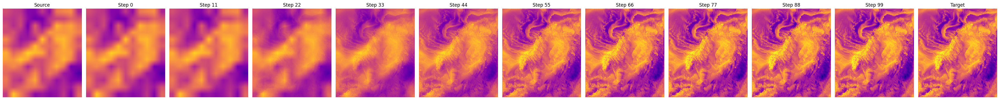

In [ ]:
states = ir_sde.interpolate(LQ, HQ)

## Stochastic Interpolants

In [26]:
from neural_lam.models.stochastic_interpolants import Interpolant

states_zt = []
states_target = []

timesteps = torch.linspace(0, 1, 100)
dt = timesteps[1] - timesteps[0]

I = Interpolant(sigma_coef=1, beta_fn='t^2')
x = LQ
for t in timesteps:

    t = torch.tensor([t])
    # Prepare batch
    D = {'z0': LQ, 'z1': HQ, 'label': None, 'N': LQ.shape[0]}   

    # Get random batch of times
    D['t'] = t

    # Conditioning on LQ
    D['cond'] = LQ

    # Interpolant noise
    D['noise'] = torch.rand_like(LQ, device=LQ.device)

    # Get alpha, beta, etc
    D = I.interpolant_coefs(D)

    # zt
    zt = I.compute_zt(D).squeeze()
    states_zt.append(zt)

    # Target
    x = x + I.compute_target(D).squeeze() * dt
    states_target.append(x)

states_zt = np.array(states_zt)
states_target = np.array(states_target)

print(states_zt.shape)


(100, 17, 268, 238)


## Plotting

/var/folders/16/8yvsfpws3tz2q2ll2_qyslpm0000gr/T/ipykernel_71439/1779196741.py:11: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  source_numpy = np.array(source[var])
/var/folders/16/8yvsfpws3tz2q2ll2_qyslpm0000gr/T/ipykernel_71439/1779196741.py:12: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  target_numpy = np.array(target[var])


Number of images: 10/100


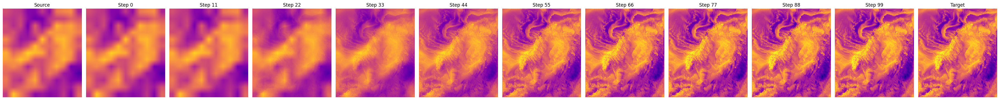

Number of images: 10/100


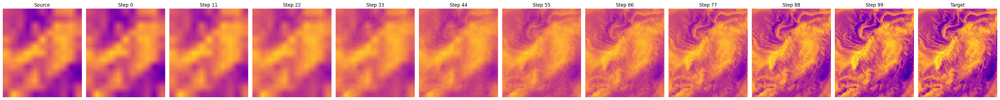

/var/folders/16/8yvsfpws3tz2q2ll2_qyslpm0000gr/T/ipykernel_71439/1204264259.py:7: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  plot_states(LQ, HQ, states - states_zt, interval=interval, var=var_idx)


Number of images: 10/100


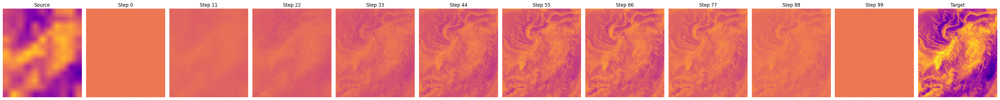

Number of images: 10/100


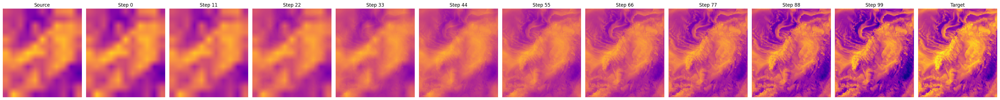

Number of images: 10/100


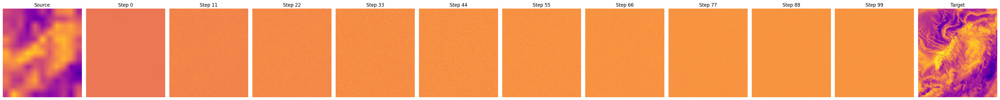

In [28]:
interval = 10
var_idx = 4

# Plotting
plot_states(LQ, HQ, states, interval=interval, var=var_idx)
plot_states(LQ, HQ, states_zt, interval=interval, var=var_idx)
plot_states(LQ, HQ, states - states_zt, interval=interval, var=var_idx)
plot_states(LQ, HQ, states_target, interval=interval, var=var_idx)
plot_states(LQ, HQ, states_zt - states_target, interval=interval, var=var_idx)
